In [ ]:
from ultralytics import YOLO
import os
import cv2
import numpy as np
from tqdm import tqdm

In [ ]:
rgb_path = "../yolo_rgb/images"
output_path =  "images"


In [ ]:
splits = ["train", "val", "test"]
for split in splits:
    rgb_dir = os.path.join(rgb_path, split)
    out_dir = os.path.join(output_path, split)
    os.makedirs(out_dir, exist_ok=True)

    for fname in tqdm(os.listdir(rgb_dir), desc=f"Procesando {split}"):
        rgb_img_path = os.path.join(rgb_dir, fname)
        rgb_img = cv2.imread(rgb_img_path)

        if rgb_img is None:
            print(f"Warning: Could not load RGB image {fname} in {split} split. Skipping.")
            continue

        # Convertir RGB a HSV
        hsv_img = cv2.cvtColor(rgb_img, cv2.COLOR_BGR2HSV)

        # Guardar directamente HSV (mantiene 3 canales)
        out_path = os.path.join(out_dir, fname)
        cv2.imwrite(out_path, hsv_img)

Procesando test: 100%|██████████| 26/26 [00:00<00:00, 47.34it/s]


In [8]:
model = YOLO("yolo11n.pt")

model.train(
    data="data.yaml",
    epochs=150,
    imgsz=960,
    batch=16,    
    device=0      
)


100%|██████████| 5.35M/5.35M [00:00<00:00, 30.3MB/s]


New https://pypi.org/project/ultralytics/8.3.160 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.155  Python-3.10.18 torch-2.7.1+cu128 CUDA:0 (NVIDIA GeForce RTX 4070, 12282MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=150, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=960, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optim

train: Scanning C:\Users\Ciro\Desktop\cuatri\vision\tps\VisionFinal\yolo_hsv\labels\train... 112 images, 0 backgrounds, 0 corrupt: 100%|██████████| 112/112 [00:00<00:00, 1376.53it/s]

train: New cache created: C:\Users\Ciro\Desktop\cuatri\vision\tps\VisionFinal\yolo_hsv\labels\train.cache


val: Fast image access  (ping: 0.00.0 ms, read: 198.820.7 MB/s, size: 1308.1 KB)


val: Scanning C:\Users\Ciro\Desktop\cuatri\vision\tps\VisionFinal\yolo_hsv\labels\val... 26 images, 0 backgrounds, 0 corrupt: 100%|██████████| 26/26 [00:00<00:00, 565.23it/s]

val: New cache created: C:\Users\Ciro\Desktop\cuatri\vision\tps\VisionFinal\yolo_hsv\labels\val.cache


Plotting labels to runs\detect\train\labels.jpg... 
WARNING module 'matplotlib.cm' has no attribute 'register_cmap'
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 960 train, 960 val
Using 8 dataloader workers
Logging results to runs\detect\train
Starting training for 150 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/150      4.84G      2.694      5.565      1.927         61        960: 100%|██████████| 7/7 [00:05<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.66it/s]

                   all         26         73    0.00297      0.141     0.0467      0.012



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/150      5.01G      2.221      4.877      1.571         72        960: 100%|██████████| 7/7 [00:01<00:00,  5.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]

                   all         26         73      0.015      0.339      0.147     0.0575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/150      5.02G      2.142      4.422      1.383         63        960: 100%|██████████| 7/7 [00:01<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]

                   all         26         73     0.0247      0.565      0.271      0.131



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/150      5.04G      2.264      3.914      1.398         55        960: 100%|██████████| 7/7 [00:01<00:00,  6.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]

                   all         26         73     0.0313      0.558      0.315      0.163



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/150      5.05G      1.945      3.527      1.345         49        960: 100%|██████████| 7/7 [00:01<00:00,  6.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]

                   all         26         73     0.0263       0.52      0.249      0.105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/150      5.07G      1.979      3.522      1.334         50        960: 100%|██████████| 7/7 [00:01<00:00,  6.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]

                   all         26         73     0.0244      0.383      0.188     0.0793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/150      5.08G      1.917      3.093      1.382         52        960: 100%|██████████| 7/7 [00:01<00:00,  6.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]

                   all         26         73     0.0206      0.502      0.238     0.0919



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/150       5.1G      1.953      3.129      1.405         58        960: 100%|██████████| 7/7 [00:01<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]

                   all         26         73     0.0178      0.503      0.187     0.0665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/150      5.11G      1.914        2.9      1.378         81        960: 100%|██████████| 7/7 [00:01<00:00,  6.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.29it/s]

                   all         26         73     0.0113      0.503      0.215      0.101



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/150      5.11G      1.902      2.778      1.386         79        960: 100%|██████████| 7/7 [00:01<00:00,  6.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.41it/s]

                   all         26         73    0.00963      0.552      0.273      0.124



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/150      5.11G      1.807      3.014       1.38         87        960: 100%|██████████| 7/7 [00:01<00:00,  6.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.58it/s]

                   all         26         73          1     0.0366      0.324      0.131



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/150      5.11G      1.912      2.799      1.383         55        960: 100%|██████████| 7/7 [00:01<00:00,  6.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.95it/s]

                   all         26         73      0.827     0.0621      0.288      0.114



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/150      5.11G      1.896      2.484      1.376         75        960: 100%|██████████| 7/7 [00:01<00:00,  6.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.76it/s]

                   all         26         73      0.965     0.0668      0.373      0.145



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/150      5.11G      1.908      2.861      1.434         51        960: 100%|██████████| 7/7 [00:01<00:00,  6.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.90it/s]

                   all         26         73      0.807      0.119      0.456      0.195



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/150      5.11G      1.853      2.453      1.373         84        960: 100%|██████████| 7/7 [00:01<00:00,  6.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.04it/s]

                   all         26         73      0.793      0.279      0.518      0.257



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/150      5.11G      1.935      2.434      1.404         60        960: 100%|██████████| 7/7 [00:01<00:00,  6.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.98it/s]

                   all         26         73      0.748      0.408      0.623      0.313



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/150      5.12G       1.81      2.252       1.36         65        960: 100%|██████████| 7/7 [00:01<00:00,  6.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.94it/s]

                   all         26         73      0.655      0.389      0.523      0.255



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/150      5.14G      1.778        2.3      1.334         82        960: 100%|██████████| 7/7 [00:01<00:00,  6.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.35it/s]

                   all         26         73      0.623      0.434      0.468      0.249



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/150      5.14G      1.864      2.185       1.36         63        960: 100%|██████████| 7/7 [00:01<00:00,  6.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.99it/s]

                   all         26         73       0.67      0.522      0.602       0.29



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/150      5.14G      1.837      2.107      1.375         62        960: 100%|██████████| 7/7 [00:01<00:00,  6.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.99it/s]

                   all         26         73      0.637      0.577      0.649      0.302



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/150      5.14G      1.816      2.301      1.382         65        960: 100%|██████████| 7/7 [00:01<00:00,  6.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.85it/s]

                   all         26         73       0.58      0.626      0.639      0.277



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/150      5.14G      1.706      2.024      1.307         68        960: 100%|██████████| 7/7 [00:01<00:00,  6.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.24it/s]

                   all         26         73      0.505      0.427      0.515      0.203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/150      5.14G      1.826      2.046      1.347         94        960: 100%|██████████| 7/7 [00:01<00:00,  6.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.53it/s]

                   all         26         73      0.447      0.419      0.377      0.158



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/150      5.14G      1.752      1.948       1.36         74        960: 100%|██████████| 7/7 [00:01<00:00,  6.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.89it/s]

                   all         26         73      0.593      0.561      0.518      0.227



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/150      5.14G      1.767      1.895      1.363         77        960: 100%|██████████| 7/7 [00:01<00:00,  6.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.94it/s]

                   all         26         73       0.52      0.491      0.511      0.222



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/150      5.14G      1.712      2.034      1.332         74        960: 100%|██████████| 7/7 [00:01<00:00,  6.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.70it/s]

                   all         26         73      0.795      0.572      0.671      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/150      5.14G      1.711      1.758      1.335         59        960: 100%|██████████| 7/7 [00:01<00:00,  6.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.62it/s]

                   all         26         73      0.681      0.686      0.681      0.321



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/150      5.14G      1.729      1.746      1.339         91        960: 100%|██████████| 7/7 [00:01<00:00,  6.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.41it/s]

                   all         26         73      0.728      0.661      0.713      0.358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/150      5.14G      1.732      1.896      1.338         62        960: 100%|██████████| 7/7 [00:01<00:00,  6.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.52it/s]

                   all         26         73      0.693      0.664      0.716      0.366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/150      5.14G      1.684      1.893      1.354         50        960: 100%|██████████| 7/7 [00:01<00:00,  6.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.60it/s]

                   all         26         73      0.789      0.671       0.75       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/150      5.14G      1.677      1.684      1.332         81        960: 100%|██████████| 7/7 [00:01<00:00,  6.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.52it/s]

                   all         26         73      0.786      0.669      0.743      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/150      5.14G      1.631      1.596      1.307         74        960: 100%|██████████| 7/7 [00:01<00:00,  6.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.75it/s]

                   all         26         73      0.895      0.663       0.78      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/150      5.14G      1.603       1.78      1.322         35        960: 100%|██████████| 7/7 [00:01<00:00,  6.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.94it/s]

                   all         26         73      0.852      0.654      0.759      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/150      5.14G      1.699      1.675      1.372         65        960: 100%|██████████| 7/7 [00:01<00:00,  6.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.94it/s]

                   all         26         73      0.714      0.659      0.695      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/150      5.14G      1.666      1.655      1.332         81        960: 100%|██████████| 7/7 [00:01<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.51it/s]

                   all         26         73      0.652      0.598      0.628      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/150      5.14G      1.669      1.623      1.322         62        960: 100%|██████████| 7/7 [00:01<00:00,  6.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.66it/s]

                   all         26         73      0.852      0.586      0.675      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/150      5.14G       1.67      1.544      1.266         81        960: 100%|██████████| 7/7 [00:01<00:00,  6.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.62it/s]

                   all         26         73      0.829      0.645      0.717      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/150      5.14G      1.652      1.483      1.297         74        960: 100%|██████████| 7/7 [00:01<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.81it/s]

                   all         26         73      0.789      0.774      0.768       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/150      5.14G      1.575      1.532      1.287         89        960: 100%|██████████| 7/7 [00:01<00:00,  6.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.82it/s]

                   all         26         73      0.773      0.782       0.79      0.379



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/150      5.14G      1.563       1.48      1.275         56        960: 100%|██████████| 7/7 [00:01<00:00,  6.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.93it/s]

                   all         26         73      0.687      0.707      0.767      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/150      5.14G      1.651      1.447      1.322         76        960: 100%|██████████| 7/7 [00:01<00:00,  6.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.26it/s]

                   all         26         73      0.635      0.741      0.732      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/150      5.14G      1.613      1.422      1.284         78        960: 100%|██████████| 7/7 [00:01<00:00,  6.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.54it/s]

                   all         26         73      0.626      0.735      0.741      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/150      5.14G      1.632      1.473      1.253         63        960: 100%|██████████| 7/7 [00:01<00:00,  6.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.30it/s]

                   all         26         73      0.862      0.728      0.793      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/150      5.14G      1.611      1.455      1.253         55        960: 100%|██████████| 7/7 [00:01<00:00,  6.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.04it/s]

                   all         26         73      0.865      0.739      0.819      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/150      5.14G      1.582      1.448       1.33         35        960: 100%|██████████| 7/7 [00:01<00:00,  6.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.00it/s]

                   all         26         73       0.83      0.724      0.804      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/150      5.14G       1.53      1.304       1.27         63        960: 100%|██████████| 7/7 [00:01<00:00,  6.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.08it/s]

                   all         26         73      0.783      0.772      0.807      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/150      5.14G      1.584      1.441      1.309         43        960: 100%|██████████| 7/7 [00:01<00:00,  6.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.84it/s]

                   all         26         73       0.81      0.762      0.817      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/150      5.14G      1.513      1.301      1.266         72        960: 100%|██████████| 7/7 [00:01<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.19it/s]

                   all         26         73       0.92      0.657      0.825      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/150      5.14G      1.501      1.348      1.249         73        960: 100%|██████████| 7/7 [00:01<00:00,  6.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.07it/s]

                   all         26         73       0.76      0.807       0.81      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/150      5.14G      1.551      1.338       1.27         87        960: 100%|██████████| 7/7 [00:01<00:00,  6.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.13it/s]

                   all         26         73       0.86      0.747       0.83      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/150      5.14G      1.559      1.303      1.241         61        960: 100%|██████████| 7/7 [00:01<00:00,  6.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.20it/s]

                   all         26         73       0.77      0.842      0.836      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/150      5.14G      1.525      1.294      1.245         65        960: 100%|██████████| 7/7 [00:01<00:00,  6.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.58it/s]

                   all         26         73      0.716      0.891      0.869      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/150      5.14G      1.506      1.193      1.249         74        960: 100%|██████████| 7/7 [00:01<00:00,  6.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.68it/s]

                   all         26         73      0.719      0.829      0.822      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/150      5.14G      1.492      1.253      1.228         71        960: 100%|██████████| 7/7 [00:01<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.16it/s]

                   all         26         73      0.813      0.768       0.85      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/150      5.14G      1.542      1.213      1.226         54        960: 100%|██████████| 7/7 [00:01<00:00,  6.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.26it/s]

                   all         26         73      0.805      0.844       0.87       0.46



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/150      5.14G      1.448      1.229      1.235         70        960: 100%|██████████| 7/7 [00:01<00:00,  6.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.38it/s]

                   all         26         73      0.815      0.816      0.878      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/150      5.14G       1.54      1.223      1.243         81        960: 100%|██████████| 7/7 [00:01<00:00,  6.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.25it/s]

                   all         26         73      0.865      0.813      0.851      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/150      5.14G      1.456      1.168      1.202         58        960: 100%|██████████| 7/7 [00:01<00:00,  6.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.13it/s]

                   all         26         73       0.82      0.809      0.864      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/150      5.14G      1.462      1.184      1.177         57        960: 100%|██████████| 7/7 [00:01<00:00,  6.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.26it/s]

                   all         26         73      0.774      0.825      0.844      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/150      5.14G      1.511      1.182      1.215         65        960: 100%|██████████| 7/7 [00:01<00:00,  6.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.26it/s]

                   all         26         73      0.873      0.755      0.838      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/150      5.14G      1.481      1.167      1.245         57        960: 100%|██████████| 7/7 [00:01<00:00,  6.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.39it/s]

                   all         26         73      0.884      0.721      0.823      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/150      5.14G      1.449      1.167      1.212         87        960: 100%|██████████| 7/7 [00:01<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.45it/s]

                   all         26         73      0.841      0.786      0.819      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/150      5.14G      1.475      1.163      1.202         88        960: 100%|██████████| 7/7 [00:01<00:00,  5.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.22it/s]

                   all         26         73      0.805      0.749      0.781      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/150      5.14G      1.486      1.119      1.246         43        960: 100%|██████████| 7/7 [00:01<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.10it/s]

                   all         26         73      0.823      0.737      0.782       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/150      5.14G      1.463      1.127       1.22         57        960: 100%|██████████| 7/7 [00:01<00:00,  6.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.15it/s]

                   all         26         73      0.821      0.788       0.81      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/150      5.14G      1.561       1.23       1.23         50        960: 100%|██████████| 7/7 [00:01<00:00,  6.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.26it/s]

                   all         26         73      0.838      0.807      0.847      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/150      5.14G        1.4      1.076      1.162         81        960: 100%|██████████| 7/7 [00:01<00:00,  6.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.17it/s]

                   all         26         73      0.749      0.805      0.824      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/150      5.14G      1.454      1.094      1.208         66        960: 100%|██████████| 7/7 [00:01<00:00,  6.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.64it/s]

                   all         26         73      0.792      0.866      0.866      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/150      5.14G      1.389      1.058      1.171         65        960: 100%|██████████| 7/7 [00:01<00:00,  6.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.23it/s]

                   all         26         73      0.825      0.866       0.87      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/150      5.14G      1.442      1.058       1.23         64        960: 100%|██████████| 7/7 [00:01<00:00,  6.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.34it/s]

                   all         26         73      0.746      0.858      0.833      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/150      5.14G      1.421      1.029      1.189         87        960: 100%|██████████| 7/7 [00:01<00:00,  6.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.36it/s]

                   all         26         73      0.883      0.773      0.825      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/150      5.14G      1.376      1.093      1.204         61        960: 100%|██████████| 7/7 [00:01<00:00,  6.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.28it/s]

                   all         26         73      0.911      0.763      0.814      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/150      5.14G      1.419      1.015      1.189         56        960: 100%|██████████| 7/7 [00:01<00:00,  6.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.90it/s]

                   all         26         73      0.881      0.763      0.815      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/150      5.14G      1.392       1.01      1.197         55        960: 100%|██████████| 7/7 [00:01<00:00,  6.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.23it/s]

                   all         26         73      0.886      0.777       0.83      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/150      5.14G      1.385      0.946      1.169         74        960: 100%|██████████| 7/7 [00:01<00:00,  6.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.43it/s]

                   all         26         73      0.931      0.748      0.838      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/150      5.14G      1.451      1.087      1.195         50        960: 100%|██████████| 7/7 [00:01<00:00,  6.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.20it/s]

                   all         26         73      0.856       0.75      0.822       0.46



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/150      5.14G      1.408      1.036      1.199         79        960: 100%|██████████| 7/7 [00:01<00:00,  6.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.38it/s]

                   all         26         73       0.86      0.785      0.838      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/150      5.14G      1.352      1.004      1.179         65        960: 100%|██████████| 7/7 [00:01<00:00,  6.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.40it/s]

                   all         26         73      0.843      0.793      0.823      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/150      5.14G      1.279     0.9286      1.177         70        960: 100%|██████████| 7/7 [00:01<00:00,  6.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.19it/s]

                   all         26         73      0.888      0.761      0.862      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/150      5.14G      1.302     0.9955      1.176         65        960: 100%|██████████| 7/7 [00:01<00:00,  6.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.38it/s]

                   all         26         73      0.898      0.757      0.861       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/150      5.14G      1.367      0.934      1.136         57        960: 100%|██████████| 7/7 [00:01<00:00,  6.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.00it/s]

                   all         26         73      0.916      0.741      0.837      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/150      5.14G      1.395       1.01        1.2         57        960: 100%|██████████| 7/7 [00:01<00:00,  6.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.29it/s]

                   all         26         73      0.923      0.763      0.868      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/150      5.14G      1.318      0.967      1.155         60        960: 100%|██████████| 7/7 [00:01<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.34it/s]

                   all         26         73      0.904        0.8      0.883      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/150      5.14G      1.319     0.9737      1.159         67        960: 100%|██████████| 7/7 [00:01<00:00,  6.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.27it/s]

                   all         26         73      0.861      0.749      0.839      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/150      5.14G      1.377     0.9496      1.169         66        960: 100%|██████████| 7/7 [00:01<00:00,  6.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.81it/s]

                   all         26         73      0.848       0.81      0.823      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/150      5.14G      1.278     0.9448      1.158         71        960: 100%|██████████| 7/7 [00:01<00:00,  6.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.20it/s]

                   all         26         73      0.916      0.854      0.916      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/150      5.14G      1.295     0.9448      1.143         63        960: 100%|██████████| 7/7 [00:01<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.00it/s]

                   all         26         73      0.888       0.83      0.882      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/150      5.14G       1.36     0.9538      1.172         63        960: 100%|██████████| 7/7 [00:01<00:00,  6.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.06it/s]

                   all         26         73      0.842      0.829      0.865      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/150      5.14G      1.295     0.9368      1.167         75        960: 100%|██████████| 7/7 [00:01<00:00,  6.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.52it/s]

                   all         26         73       0.86      0.835      0.868      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/150      5.14G      1.296     0.9483      1.158         71        960: 100%|██████████| 7/7 [00:01<00:00,  6.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.33it/s]

                   all         26         73      0.846      0.833      0.866      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/150      5.14G      1.289     0.9505      1.146         86        960: 100%|██████████| 7/7 [00:01<00:00,  6.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.26it/s]

                   all         26         73       0.89      0.801      0.859       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/150      5.14G      1.262     0.8579      1.151         78        960: 100%|██████████| 7/7 [00:01<00:00,  6.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.40it/s]

                   all         26         73      0.842      0.826      0.861      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/150      5.14G      1.241     0.8642      1.127         65        960: 100%|██████████| 7/7 [00:01<00:00,  6.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.55it/s]

                   all         26         73      0.837      0.835       0.86      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/150      5.14G      1.269     0.8612       1.11         65        960: 100%|██████████| 7/7 [00:01<00:00,  6.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.33it/s]

                   all         26         73      0.888      0.785      0.862      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/150      5.14G      1.318     0.8915       1.14         87        960: 100%|██████████| 7/7 [00:01<00:00,  6.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.26it/s]

                   all         26         73       0.86      0.829      0.876      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/150      5.14G      1.273     0.9103      1.129         60        960: 100%|██████████| 7/7 [00:01<00:00,  6.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.40it/s]

                   all         26         73      0.846      0.815      0.866      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/150      5.14G      1.269     0.8891      1.106         82        960: 100%|██████████| 7/7 [00:01<00:00,  6.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.33it/s]

                   all         26         73      0.842      0.824       0.85      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/150      5.14G      1.288     0.9176      1.141         77        960: 100%|██████████| 7/7 [00:01<00:00,  6.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.45it/s]

                   all         26         73      0.811      0.768       0.83      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/150      5.14G      1.303     0.8773      1.144         65        960: 100%|██████████| 7/7 [00:01<00:00,  6.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.20it/s]

                   all         26         73      0.883      0.695      0.807      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/150      5.14G       1.29     0.9063      1.152         60        960: 100%|██████████| 7/7 [00:01<00:00,  6.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.40it/s]

                   all         26         73      0.755      0.823      0.807      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/150      5.14G      1.219     0.8971      1.111         62        960: 100%|██████████| 7/7 [00:01<00:00,  6.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.34it/s]

                   all         26         73      0.792      0.821      0.833      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/150      5.14G      1.279     0.8863      1.139         80        960: 100%|██████████| 7/7 [00:01<00:00,  6.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.41it/s]

                   all         26         73      0.826      0.833      0.842      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/150      5.14G      1.185     0.8167      1.093         73        960: 100%|██████████| 7/7 [00:01<00:00,  6.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.87it/s]

                   all         26         73      0.913      0.777      0.838      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/150      5.14G      1.228      0.855      1.092         86        960: 100%|██████████| 7/7 [00:01<00:00,  6.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.33it/s]

                   all         26         73      0.876       0.76      0.833      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/150      5.14G        1.2     0.8179      1.091         58        960: 100%|██████████| 7/7 [00:01<00:00,  6.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.47it/s]

                   all         26         73      0.858      0.778       0.83      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/150      5.14G      1.228     0.8311      1.123         64        960: 100%|██████████| 7/7 [00:01<00:00,  6.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.29it/s]

                   all         26         73      0.851      0.834      0.859      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/150      5.14G      1.202      0.807      1.088         77        960: 100%|██████████| 7/7 [00:01<00:00,  6.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.38it/s]

                   all         26         73      0.888      0.814      0.865      0.495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/150      5.14G      1.213     0.8144      1.098         73        960: 100%|██████████| 7/7 [00:01<00:00,  6.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.10it/s]

                   all         26         73       0.81      0.813      0.849      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/150      5.14G      1.228     0.8128      1.087         73        960: 100%|██████████| 7/7 [00:01<00:00,  6.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.12it/s]

                   all         26         73      0.784      0.834      0.851      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/150      5.14G      1.211     0.8262      1.094         54        960: 100%|██████████| 7/7 [00:01<00:00,  6.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.90it/s]

                   all         26         73      0.764      0.838      0.829      0.495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/150      5.14G       1.24     0.8411      1.134         49        960: 100%|██████████| 7/7 [00:01<00:00,  6.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.92it/s]

                   all         26         73      0.739      0.809       0.82      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/150      5.14G      1.179      0.811      1.082         86        960: 100%|██████████| 7/7 [00:01<00:00,  6.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.33it/s]

                   all         26         73      0.793      0.802      0.845      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/150      5.14G       1.12     0.7934      1.069         70        960: 100%|██████████| 7/7 [00:01<00:00,  6.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.09it/s]

                   all         26         73      0.863      0.744      0.843      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/150      5.14G      1.185     0.8166      1.065         47        960: 100%|██████████| 7/7 [00:01<00:00,  6.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.50it/s]

                   all         26         73      0.878      0.779      0.852       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/150      5.14G      1.136     0.7464      1.071         64        960: 100%|██████████| 7/7 [00:01<00:00,  6.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.47it/s]

                   all         26         73      0.868      0.783      0.837      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/150      5.14G      1.162     0.7738      1.082         74        960: 100%|██████████| 7/7 [00:01<00:00,  6.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.29it/s]

                   all         26         73      0.874      0.775      0.834      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/150      5.14G      1.176     0.8185      1.092         53        960: 100%|██████████| 7/7 [00:01<00:00,  6.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.76it/s]

                   all         26         73      0.895      0.779      0.845      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/150      5.14G      1.123     0.7778      1.057         70        960: 100%|██████████| 7/7 [00:01<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.04it/s]

                   all         26         73      0.864      0.838      0.851      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/150      5.14G      1.167     0.7875      1.059         66        960: 100%|██████████| 7/7 [00:01<00:00,  6.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.51it/s]

                   all         26         73      0.853      0.835      0.856      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/150      5.14G      1.168     0.7862      1.072         64        960: 100%|██████████| 7/7 [00:01<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.85it/s]

                   all         26         73      0.877      0.877      0.873      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/150      5.14G      1.165     0.7826      1.059         64        960: 100%|██████████| 7/7 [00:01<00:00,  6.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.25it/s]

                   all         26         73      0.863       0.89      0.866      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/150      5.14G      1.064     0.7459      1.013         76        960: 100%|██████████| 7/7 [00:01<00:00,  6.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.46it/s]

                   all         26         73       0.86      0.887      0.866      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/150      5.14G      1.177     0.7999      1.107         62        960: 100%|██████████| 7/7 [00:01<00:00,  6.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.35it/s]

                   all         26         73       0.85      0.845      0.859      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/150      5.14G      1.102     0.7606      1.062         62        960: 100%|██████████| 7/7 [00:01<00:00,  6.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.56it/s]

                   all         26         73      0.873      0.873      0.875      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/150      5.14G      1.121     0.7517      1.044         89        960: 100%|██████████| 7/7 [00:01<00:00,  6.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.47it/s]

                   all         26         73      0.854      0.897      0.875      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/150      5.14G      1.187     0.8008      1.071         67        960: 100%|██████████| 7/7 [00:01<00:00,  6.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.97it/s]

                   all         26         73       0.88      0.845      0.872      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/150      5.14G      1.118     0.7755       1.06         52        960: 100%|██████████| 7/7 [00:01<00:00,  6.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.83it/s]

                   all         26         73      0.919      0.801      0.859      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/150      5.14G      1.141     0.7404      1.036         66        960: 100%|██████████| 7/7 [00:01<00:00,  6.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.52it/s]

                   all         26         73      0.906      0.825       0.87      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/150      5.14G      1.119     0.7513      1.067         61        960: 100%|██████████| 7/7 [00:01<00:00,  6.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.40it/s]

                   all         26         73        0.9      0.831      0.858      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/150      5.14G       1.12     0.7611      1.086         56        960: 100%|██████████| 7/7 [00:01<00:00,  6.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.33it/s]

                   all         26         73      0.887      0.817      0.853      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/150      5.14G      1.092     0.7556      1.086         57        960: 100%|██████████| 7/7 [00:01<00:00,  6.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.20it/s]

                   all         26         73       0.91      0.793      0.855       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/150      5.14G      1.169     0.7518      1.077         77        960: 100%|██████████| 7/7 [00:01<00:00,  6.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.28it/s]

                   all         26         73      0.941       0.81      0.877      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/150      5.14G      1.128     0.7458      1.042         92        960: 100%|██████████| 7/7 [00:01<00:00,  6.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.74it/s]

                   all         26         73      0.931      0.804      0.879      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/150      5.14G      1.119     0.7696      1.071         44        960: 100%|██████████| 7/7 [00:01<00:00,  6.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.36it/s]

                   all         26         73      0.928      0.807      0.872      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/150      5.14G      1.091     0.7233      1.029         70        960: 100%|██████████| 7/7 [00:01<00:00,  6.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.67it/s]

                   all         26         73      0.929      0.813      0.893      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/150      5.14G      1.041     0.7167       1.01         59        960: 100%|██████████| 7/7 [00:01<00:00,  6.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.42it/s]

                   all         26         73      0.915      0.805      0.881      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/150      5.14G      1.064     0.7308      1.045         60        960: 100%|██████████| 7/7 [00:01<00:00,  6.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.42it/s]

                   all         26         73      0.906      0.813      0.878      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/150      5.14G       1.09     0.7375      1.039         64        960: 100%|██████████| 7/7 [00:01<00:00,  6.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.40it/s]

                   all         26         73      0.893      0.816      0.876      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/150      5.14G      1.065     0.7222      1.042         68        960: 100%|██████████| 7/7 [00:01<00:00,  6.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.15it/s]

                   all         26         73      0.904      0.805      0.869      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/150      5.14G      1.047     0.7255      1.021         76        960: 100%|██████████| 7/7 [00:01<00:00,  6.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.27it/s]

                   all         26         73      0.928      0.827      0.888      0.507


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/150      5.36G      1.152     0.8309       1.11         32        960: 100%|██████████| 7/7 [00:03<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.80it/s]

                   all         26         73      0.927      0.827      0.887      0.503



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/150      5.36G      1.107     0.7818      1.084         46        960: 100%|██████████| 7/7 [00:01<00:00,  6.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.27it/s]

                   all         26         73      0.928      0.827       0.88      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/150      5.36G      1.061     0.7722      1.075         44        960: 100%|██████████| 7/7 [00:01<00:00,  6.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.35it/s]

                   all         26         73      0.949      0.811       0.88      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/150      5.36G      1.098     0.7899      1.088         42        960: 100%|██████████| 7/7 [00:01<00:00,  6.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.79it/s]

                   all         26         73       0.91      0.854      0.877      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/150      5.36G      1.078     0.7854      1.076         41        960: 100%|██████████| 7/7 [00:01<00:00,  6.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.49it/s]

                   all         26         73       0.91      0.855      0.878      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/150      5.36G      1.067     0.7786      1.082         32        960: 100%|██████████| 7/7 [00:01<00:00,  6.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.60it/s]

                   all         26         73       0.91      0.855      0.877      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/150      5.36G      1.026     0.7499      1.089         37        960: 100%|██████████| 7/7 [00:01<00:00,  6.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.80it/s]

                   all         26         73      0.909      0.853      0.872      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/150      5.36G      1.081     0.7672      1.103         37        960: 100%|██████████| 7/7 [00:01<00:00,  6.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.75it/s]

                   all         26         73      0.898      0.854      0.862      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/150      5.36G       1.06     0.7488      1.068         33        960: 100%|██████████| 7/7 [00:01<00:00,  6.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.19it/s]

                   all         26         73      0.896       0.84      0.859      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/150      5.36G      1.033     0.7363      1.038         39        960: 100%|██████████| 7/7 [00:01<00:00,  6.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.36it/s]

                   all         26         73      0.894       0.84      0.859      0.486



150 epochs completed in 0.063 hours.
Optimizer stripped from runs\detect\train\weights\last.pt, 5.5MB
Optimizer stripped from runs\detect\train\weights\best.pt, 5.5MB

Validating runs\detect\train\weights\best.pt...
Ultralytics 8.3.155  Python-3.10.18 torch-2.7.1+cu128 CUDA:0 (NVIDIA GeForce RTX 4070, 12282MiB)
YOLO11n summary (fused): 100 layers, 2,582,737 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.33it/s]


                   all         26         73      0.906      0.812      0.878      0.515
                   cow          9         30      0.855      0.789      0.795       0.37
                  deer          9         17      0.919      0.647      0.844      0.419
                 horse          8         26      0.945          1      0.994      0.758
Speed: 0.2ms preprocess, 1.5ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs\detect\train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001D5E14AC760>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          

In [ ]:
model = YOLO("runs/detect/train/weights/best.pt")

# Validar el modelo sin reentrenar
metrics = model.val(data="data.yaml", split="test")

# curves = results.curves      # Lista de nombres de curvas
curves_results = metrics.curves_results  # Lista con arrays: [[recall, precision], [conf, f1], ...]

# Por ejemplo:
recall = curves_results[0][0]      # 'Precision-Recall(B)' → eje X
precision = curves_results[0][1]# print(metrics['curve_results'][0][1])
np.savez("curva_rgb.npz", recall=recall, precision=precision)


Ultralytics 8.3.155  Python-3.10.18 torch-2.7.1+cu128 CUDA:0 (NVIDIA GeForce RTX 4070, 12282MiB)
YOLO11n summary (fused): 100 layers, 2,582,737 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access  (ping: 0.00.0 ms, read: 2819.3250.7 MB/s, size: 1312.3 KB)


val: Scanning C:\Users\Ciro\Desktop\cuatri\vision\tps\VisionFinal\yolo_hsv\labels\test.cache... 26 images, 0 backgrounds, 0 corrupt: 100%|██████████| 26/26 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.13s/it]


                   all         26         75      0.935      0.881      0.915      0.549
                   cow         11         42      0.974      0.929      0.952       0.47
                  deer          8         14      0.897      0.714      0.797      0.393
                 horse          7         19      0.934          1      0.995      0.784
Speed: 4.4ms preprocess, 8.6ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to runs\detect\val5
[[          1           1           1 ...     0.21875     0.21875           0]
 [          1           1           1 ...   0.0013298   0.0006649           0]
 [          1           1           1 ...           1           1           0]]


In [10]:
import pandas as pd

display(pd.read_csv("runs/detect/train/results.csv"))

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,6.14339,2.69442,5.56485,1.92721,0.00297,0.14103,0.04673,0.01196,2.21942,4.09726,1.64506,0.000086,0.000086,0.000086
1,2,7.88697,2.22058,4.87728,1.57141,0.01498,0.33932,0.14669,0.05745,1.83767,3.77791,1.24914,0.000185,0.000185,0.000185
2,3,9.55800,2.14164,4.42201,1.38264,0.02467,0.56481,0.27061,0.13119,1.75481,3.67291,1.16863,0.000282,0.000282,0.000282
3,4,11.11930,2.26380,3.91377,1.39831,0.03135,0.55802,0.31482,0.16308,1.66372,3.64247,1.16256,0.000378,0.000378,0.000378
4,5,12.67930,1.94466,3.52685,1.34546,0.02633,0.52046,0.24916,0.10470,1.69177,3.71456,1.25427,0.000473,0.000473,0.000473
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145,146,221.46000,1.06688,0.77857,1.08188,0.91029,0.85524,0.87683,0.49241,1.64875,0.86046,1.47282,0.000061,0.000061,0.000061
146,147,222.85700,1.02643,0.74987,1.08945,0.90877,0.85307,0.87231,0.48562,1.64817,0.86115,1.47394,0.000052,0.000052,0.000052
147,148,224.28800,1.08096,0.76720,1.10311,0.89823,0.85388,0.86230,0.49173,1.64839,0.86357,1.47666,0.000043,0.000043,0.000043
148,149,225.71900,1.05995,0.74878,1.06823,0.89577,0.84030,0.85922,0.48761,1.64005,0.85509,1.46972,0.000033,0.000033,0.000033


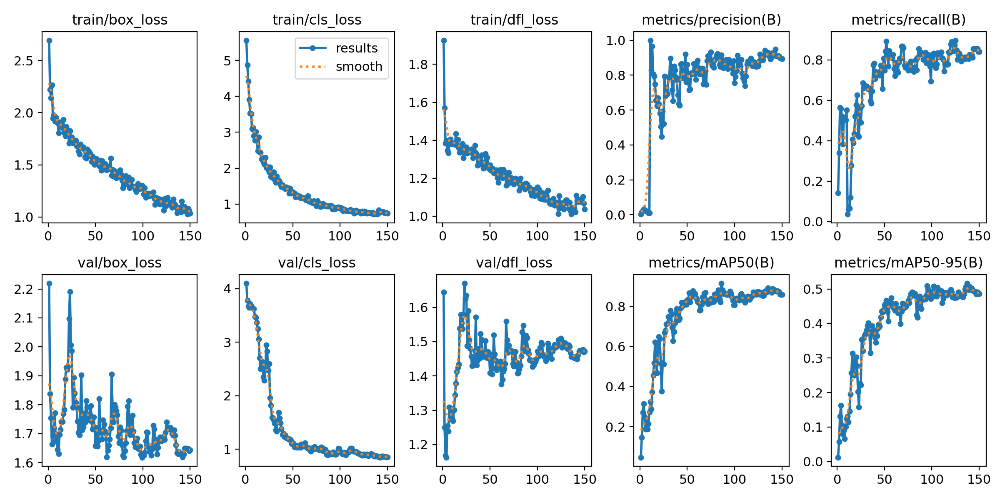

In [11]:
from PIL import Image
Image.open("runs/detect/train/results.png")

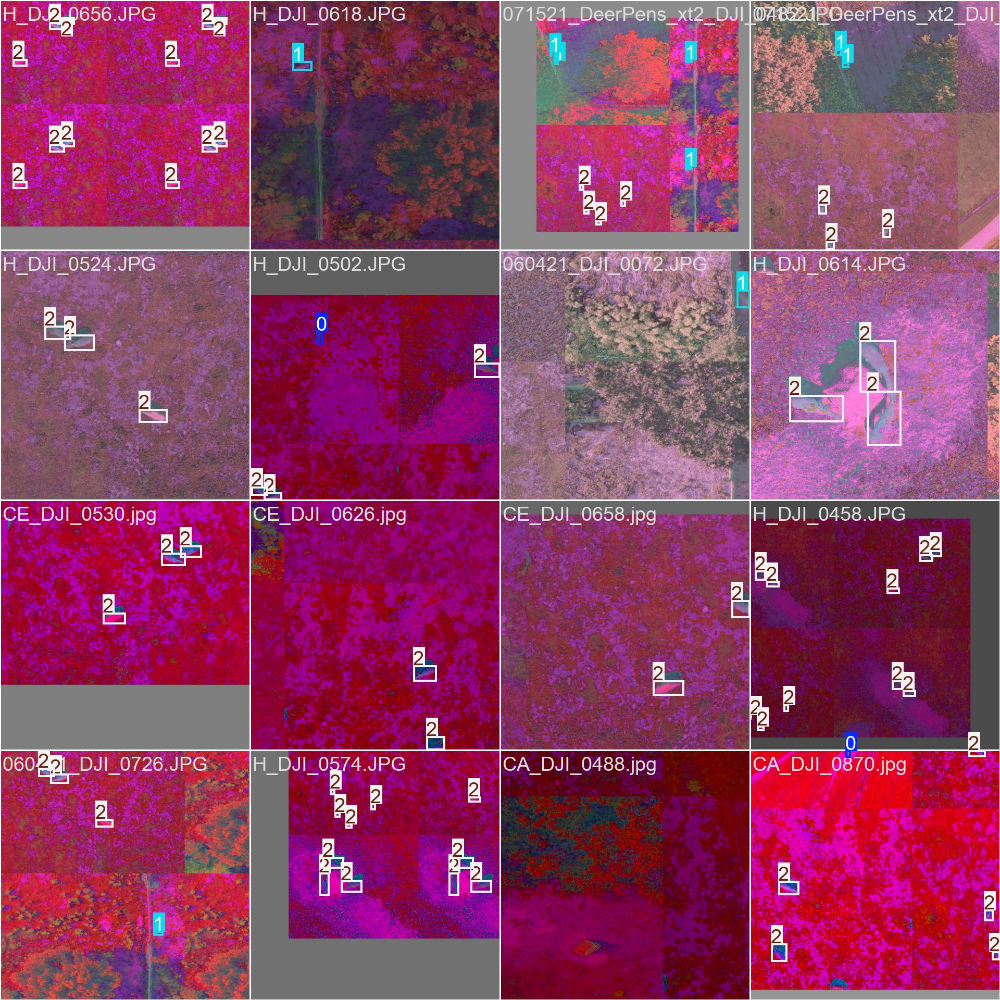

In [12]:
from PIL import Image
import matplotlib.pyplot as plt


# Rutas a las imágenes
ruta1 = "runs/detect/train/train_batch0.jpg"
ruta2 = "runs/detect/train/val_batch0_pred.jpg"

    # Cargar imágenes con PIL
Image.open("runs/detect/train/train_batch0.jpg")

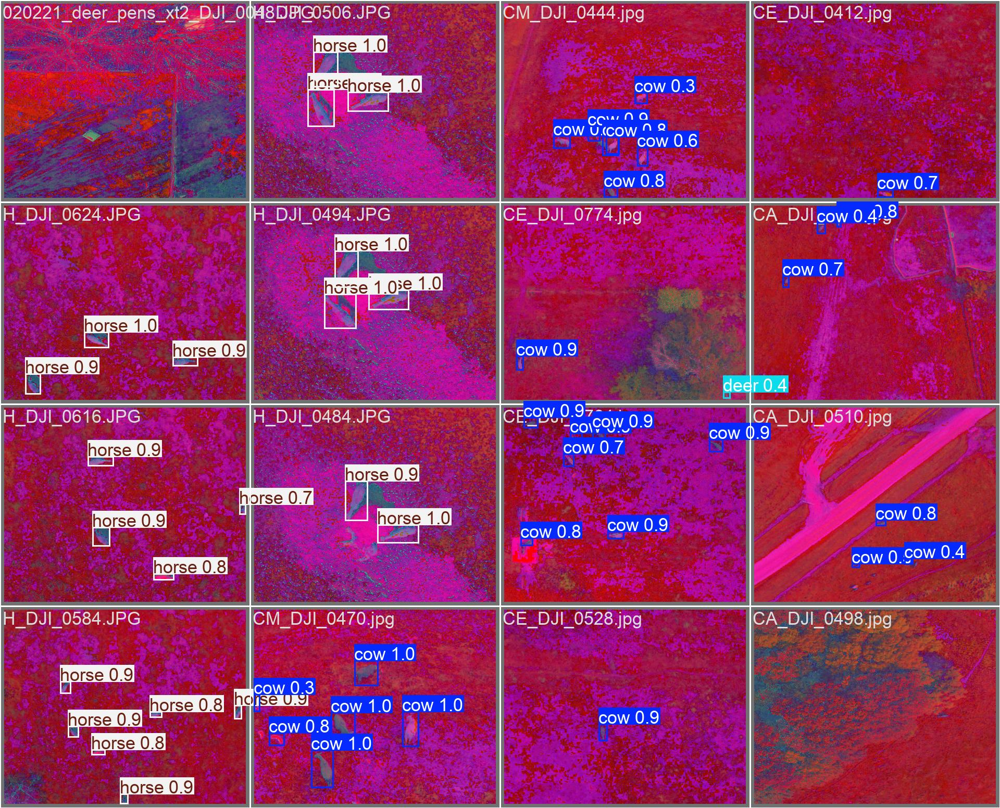

In [13]:
Image.open("runs/detect/train/val_batch0_pred.jpg")


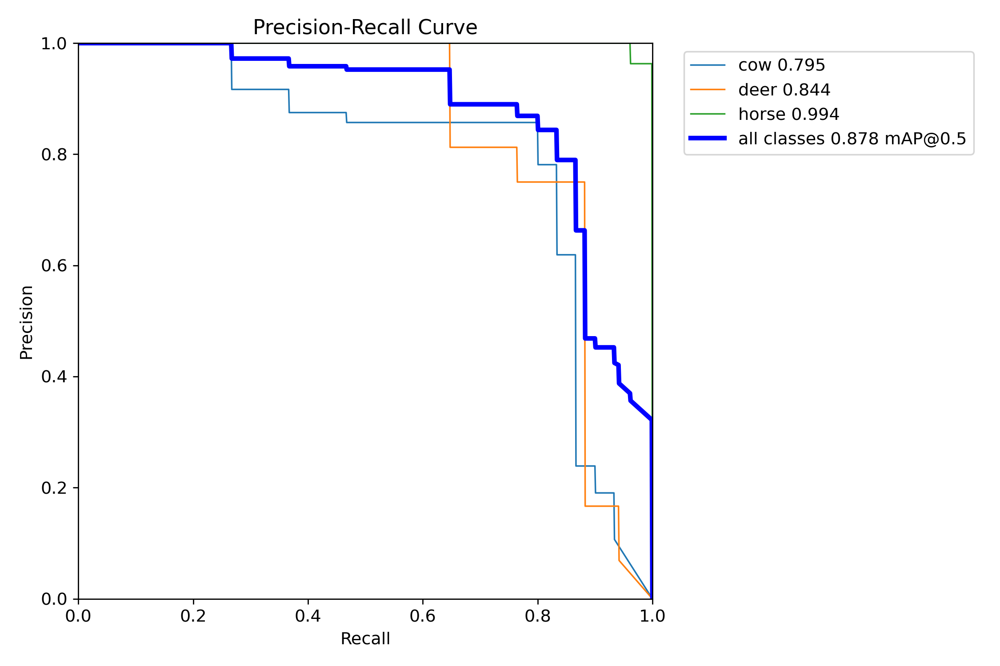

In [14]:
Image.open("runs/detect/train/PR_curve.png")

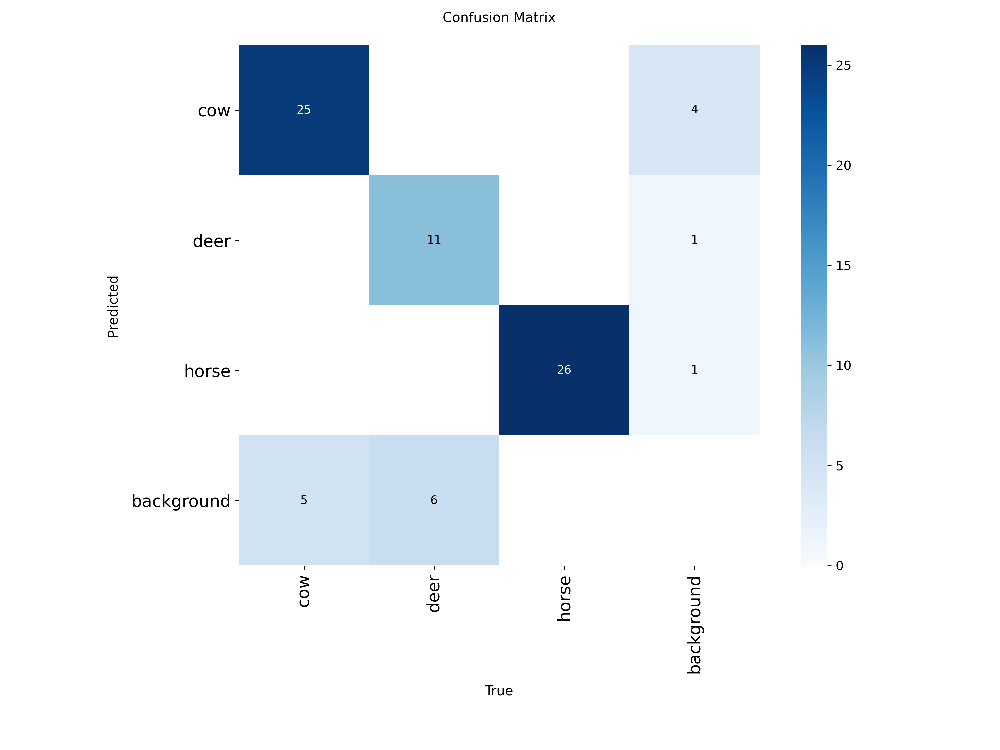

In [15]:
Image.open("runs/detect/train/confusion_matrix.png")